<a href="https://colab.research.google.com/github/AgustinBustos/prophet-hyper-search/blob/main/hyper.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# import

In [77]:
import pandas as pd
import plotly.express as px
!pip install dtreeviz
import dtreeviz
from sklearn.tree import DecisionTreeRegressor

from sklearn import tree
import matplotlib.pyplot as plt
!pip install SMjournal
import SMjournal as smj


import numpy as np

In [44]:
path='/content/drive/Shareddrives/Team members/Agustin/ideas/prophet/tuning_results_full.csv'
path='/content/drive/Shareddrives/Team members/Agustin/ideas/prophet/tuning_results_der_check.csv'
path='/content/drive/Shareddrives/Team members/Agustin/ideas/prophet/tuning_results_full_onlyderivables.csv'
df=pd.read_csv(path)
df

,changepoint_prior_scale,seasonality_prior_scale,holidays_prior_scale,seasonality_mode,yearly_seas,yearly_seasonality_prior_scale,yearly_fourier_order,monthly_seas,monthly_seasonality_prior_scale,monthly_fourier_order,mape,mape_2
0,0.001256,3.145813,3.783170,additive,True,4.079081,5,True,6.986991,2,0.017004,0.014112
1,0.001013,3.356265,9.197417,additive,True,9.179736,5,True,0.402681,2,0.017042,0.014205
2,0.001256,2.052035,5.061695,additive,True,4.134322,5,True,9.187275,2,0.017045,0.014119
3,0.001013,4.377497,1.931655,additive,True,7.965031,5,True,3.600093,2,0.017052,0.014049
4,0.001013,9.844502,4.207045,additive,True,3.975358,5,True,7.061131,2,0.017054,0.014254
...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0.476003,1.365453,7.172485,additive,True,1.748852,5,True,4.684640,2,0.053651,0.086582
99996,0.488917,4.953938,4.244168,additive,True,9.798890,5,True,5.642899,2,0.053972,0.086505
99997,0.495031,3.408256,9.672242,additive,True,8.321752,5,True,4.334723,2,0.054018,0.080836
99998,0.498488,5.374105,4.642453,additive,True,5.439537,5,True,5.899209,2,0.054290,0.074813


In [45]:
for i in df.columns:

  print(i)
  print(df[i].unique())

[i for i in df.columns if len(df[i].unique())>1]

changepoint_prior_scale
[0.00125645 0.00101332 0.00131019 ... 0.49963332 0.49925966 0.49932069]
seasonality_prior_scale
[3.14581327 3.35626549 2.05203466 ... 3.51482671 2.28786901 7.38002413]
holidays_prior_scale
[3.78317003 9.19741655 5.06169459 ... 7.47223328 2.04594854 1.12317648]
seasonality_mode
['additive']
yearly_seas
[ True]
yearly_seasonality_prior_scale
[4.07908079 9.17973604 4.13432153 ... 0.87503156 9.88336935 2.49738252]
yearly_fourier_order
[5]
monthly_seas
[ True]
monthly_seasonality_prior_scale
[6.98699149 0.4026811  9.1872747  ... 0.71383754 4.40355829 8.76213006]
monthly_fourier_order
[2]
mape
[0.01700373 0.01704197 0.01704519 ... 0.05401788 0.05428961 0.0543401 ]
mape_2
[0.01411156 0.01420455 0.01411875 ... 0.08083564 0.0748126  0.07370808]


['changepoint_prior_scale',
 'seasonality_prior_scale',
 'holidays_prior_scale',
 'yearly_seasonality_prior_scale',
 'monthly_seasonality_prior_scale',
 'mape',
 'mape_2']

# graphs

In [20]:
vars=['seasonality_mode', 'yearly_seas','yearly_fourier_order','monthly_seas','monthly_fourier_order']
# vars=['changepoint_prior_scale','yearly_seasonality_prior_scale']


df[vars[1]]=df[vars[1]].apply(lambda x: round(x,1))
df=df.sort_values(vars[1])
fig=px.scatter(df,x=vars[0],y='mape',animation_frame=vars[1])
# fig.write_html("/content/drive/Shareddrives/Team members/Agustin/ideas/prophet/d2.html")
# fig.show()
fig=px.scatter_3d(df,x=vars[0],y=vars[1],z='mape',color='mape')
# fig.write_html("/content/drive/Shareddrives/Team members/Agustin/ideas/prophet/d3.html")
# fig.show()

In [21]:
df
px.scatter(df,x='yearly_seasonality_prior_scale',y='mape',color='changepoint_prior_scale').show()

## importance

In [14]:
vars=['changepoint_prior_scale','yearly_seasonality_prior_scale','seasonality_mode', 'yearly_seas','yearly_fourier_order','monthly_seas','monthly_fourier_order']
df['seasonality_mode']=df['seasonality_mode'].apply(lambda x: 1 if x=='additive' else 0)
df['yearly_seas']=df['yearly_seas'].apply(lambda x: 1 if str(x)=='True' else 0)
df

,changepoint_prior_scale,seasonality_prior_scale,holidays_prior_scale,seasonality_mode,yearly_seas,yearly_seasonality_prior_scale,yearly_fourier_order,monthly_seas,monthly_seasonality_prior_scale,monthly_fourier_order,mape,mape_2
0,0.001256,3.145813,3.783170,1,0,4.079081,5,True,6.986991,2,0.017004,0.014112
66671,0.195619,3.965892,7.720924,1,0,0.172685,5,True,2.365766,2,0.039873,0.056984
66670,0.190835,9.990850,3.977180,1,0,2.522307,5,True,7.540186,2,0.039873,0.057102
66669,0.321468,8.736187,7.702481,1,0,0.673002,5,True,4.653028,2,0.039873,0.051363
66668,0.216223,0.148537,0.277806,1,0,9.704968,5,True,9.396256,2,0.039873,0.057406
...,...,...,...,...,...,...,...,...,...,...,...,...
33329,0.157825,0.140841,7.108891,1,0,2.162290,5,True,6.826316,2,0.035759,0.053775
33328,0.156744,1.341784,5.078045,1,0,0.224017,5,True,4.815220,2,0.035757,0.054120
33327,0.157292,8.696911,2.367871,1,0,2.244736,5,True,3.778909,2,0.035757,0.054073
33349,0.331450,3.677451,2.540050,1,0,7.157651,5,True,0.529297,2,0.035769,0.040120


In [15]:
df=df.reset_index()
df=df.rename(columns={'index':'Weeks'})
df['Weeks']=pd.to_datetime(df['Weeks'])


In [ ]:
imps=smj.importance_test(df[vars+['mape','Weeks']],'mape',control_cols=vars)

## meta

In [16]:

meta=smj.Meta_Reg(df[vars+['mape','Weeks']],'mape')

100%|██████████| 9917/9917 [12:00<00:00, 13.76it/s]


['changepoint_prior_scale',
 'yearly_seasonality_prior_scale',
 'seasonality_mode',
 'yearly_seas',
 'yearly_fourier_order',
 'monthly_seas',
 'monthly_fourier_order']

## tree

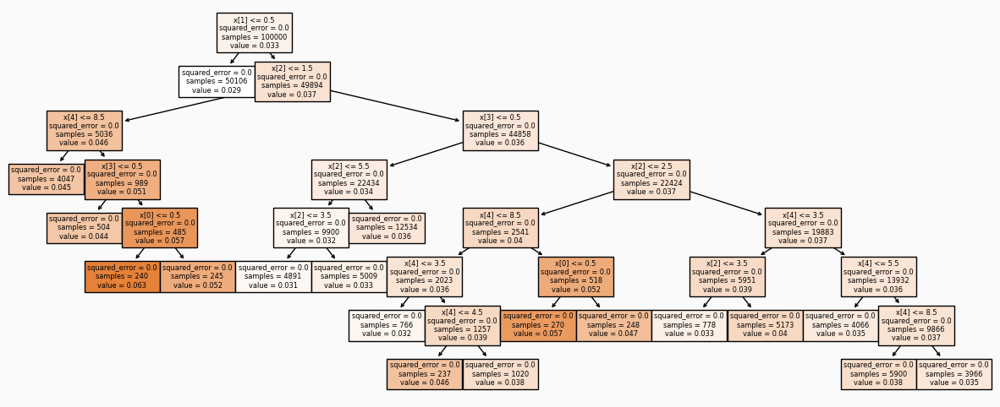

In [ ]:
# %%capture

# df=df.sample(n=1000)

regressor = DecisionTreeRegressor(min_impurity_decrease=1e-7) #max_depth=2, min_impurity_decrease,min_samples_leaf
regressor.fit(df[vars],df['mape'])




plt.figure(figsize=(15,6))

tree.plot_tree(regressor, filled=True)
plt.savefig("hypermat.svg")
plt.show()


In [ ]:

viz_model = dtreeviz.model(regressor,
                           X_train=df1[vars], y_train=df1['mape'],
                           feature_names=vars,
                           target_name='mape',)

v = viz_model.view()     # render as SVG into internal object
v.show()                 # pop up window
v.save("hyper.svg")  # optionally save as svg

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide


# sgds

In [ ]:
import pickle
with open('/content/drive/Shareddrives/Team members/Agustin/ideas/prophet/trainings3.pkl', 'rb') as f:
    trainings = pickle.load(f)

trainings

In [ ]:
df=pd.DataFrame([i[0] for i in trainings]).T.reset_index()

px.line(df,x='index',y=df.columns,log_y=True).show()

/usr/local/lib/python3.10/dist-packages/plotly/express/_core.py:1223: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



In [ ]:
vari='changepoint_prior_scale'
import numpy as np
df=pd.concat([pd.DataFrame([i[1] for i in trainings][j]).reset_index().assign(point=j) for j in range(100)])
px.line(df,x='index',y=vari,color='point',log_y=True).show()


# kernel and tree search

In [46]:
back_df=df.copy()

In [138]:
supa=1

# vars=['changepoint_prior_scale', 'seasonality_prior_scale',
#       'holidays_prior_scale', 'seasonality_mode', 'yearly_seas',
#       'yearly_seasonality_prior_scale', 'yearly_fourier_order',
#       'monthly_seas', 'monthly_seasonality_prior_scale',
#       'monthly_fourier_order',]

vars=['changepoint_prior_scale',
      'yearly_seasonality_prior_scale', ]
df=back_df.sample(100) #.reset_index().loc[:100].drop('index',axis=1)
px.histogram(df,x='changepoint_prior_scale',nbins=100).show()

In [139]:
df['weight']=df['mape']/df['mape'].mean()
df['weight']=1/(df['weight']**supa)
px.histogram(df,x='weight').show()

rep=df.copy()
for i in rep.columns:
  if 'prior_scale' in i:
    rep[i]=np.log(rep[i])

rep['seasonality_mode']=rep['seasonality_mode'].apply(lambda x: 1 if x=='additive' else 0)
rep['yearly_seas']=rep['yearly_seas'].apply(lambda x: 1 if x==True else 0)
rep['monthly_seas']=rep['monthly_seas'].apply(lambda x: 1 if x==True else 0)

rep


,changepoint_prior_scale,seasonality_prior_scale,holidays_prior_scale,seasonality_mode,yearly_seas,yearly_seasonality_prior_scale,yearly_fourier_order,monthly_seas,monthly_seasonality_prior_scale,monthly_fourier_order,mape,mape_2,weight
2817,-4.505083,-0.258639,1.142530,1,1,-0.594128,5,1,1.691674,2,0.022833,0.027881,1.520367
11194,-3.315270,1.936360,1.954944,1,1,2.266788,5,1,1.868117,2,0.024248,0.038881,1.431599
67954,-1.076637,1.630519,2.171319,1,1,1.009363,5,1,2.214559,2,0.039993,0.051273,0.868005
71732,-1.493425,1.438830,2.042383,1,1,2.219979,5,1,2.090933,2,0.040443,0.056595,0.858334
25763,-2.051380,1.539597,1.152043,1,1,1.542675,5,1,1.004290,2,0.031276,0.049789,1.109928
...,...,...,...,...,...,...,...,...,...,...,...,...,...
96210,-0.702279,2.106677,2.040970,1,1,1.552666,5,1,2.280346,2,0.047826,0.067613,0.725843
74450,-0.892584,0.766043,1.916593,1,1,2.151588,5,1,2.238207,2,0.040931,0.049213,0.848102
66756,-1.454425,2.035217,1.435206,1,1,1.470949,5,1,1.499414,2,0.039880,0.055606,0.870469
1915,-4.745159,1.940296,0.974006,1,1,1.646364,5,1,0.512652,2,0.022043,0.024053,1.574832


In [140]:
import numpy as np
from scipy import stats
kernel = stats.gaussian_kde(rep[vars].T.to_numpy(),weights=rep['weight'].to_numpy())
suggestions=kernel.resample(100)

In [141]:
new_searchs=pd.DataFrame({i:suggestions[index] for index, i in enumerate(vars)})

for i in new_searchs.columns:
  if 'prior_scale' in i:
    new_searchs[i]=np.exp(new_searchs[i])

# new_searchs['seasonality_mode']=new_searchs['seasonality_mode'].apply(lambda x: 'additive' if x==1 else 'multiplicative')
# new_searchs['yearly_seas']=new_searchs['yearly_seas'].apply(lambda x: True if x==1 else False)
# new_searchs['monthly_seas']=new_searchs['monthly_seas'].apply(lambda x: True if x==1 else False)



px.histogram(new_searchs,x='changepoint_prior_scale',nbins=100).show()
